In [3]:
%matplotlib inline
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
from astropy.io import fits
import richardsplot
import pandas as pd
#from densityplot import *

In [4]:
def figsize(hscale, 
            vscale=(np.sqrt(5.0)-1.0)/2.0,
            fig_width_pt = 336.0):
   

    """
    Get the fig_width_pt by inserting \the\textwidth into LaTeX document.

    hscale is fraction of text width you want.

    vscale is fraction of hscale (defaults to golden ratio)  
    """
   
    inches_per_pt = 1.0/72.27                       # Convert pt to inch
    fig_width = fig_width_pt*inches_per_pt*hscale   # width in inches
    fig_height = fig_width*vscale                   # height in inches
    fig_size = [fig_width, fig_height]

    return fig_size

In [5]:
import palettable

pgf_with_latex = {                      # setup matplotlib to use latex for output
    "axes.linewidth":1.5,               # width of box, 2 is too wide, 1 is too narrow
    "pgf.texsystem": "pdflatex",        # change this if using xetex or lautex
    "text.usetex": True,                # use LaTeX to write all text
    "font.family": "serif",
    "font.serif": [],                   # blank entries should cause plots to inherit fonts from the document
    "font.sans-serif": [],
    "font.monospace": [],
    "axes.labelsize": 16,               # LaTeX default is 10pt font, font size of axis text label
    "axes.labelpad" : 6,                # Distance between label and axis
    "axes.formatter.limits":[-5, 5],    # use sci notation if log10 of axis range is smaller than first or larger than second 
    "axes.formatter.useoffset":False,
    "font.size": 16,
    "legend.fontsize": 12,              # Make the legend/label fonts a little smaller
    "xtick.labelsize": 16,              # Font size of numbers 
    "ytick.labelsize": 16,
    'xtick.major.width':1, 
    'xtick.minor.width':1, 
    'ytick.major.width':1, 
    'ytick.minor.width':1, 
    'xtick.major.size':10,             # size of tickmarks in points
    'xtick.minor.size':5, 
    'ytick.major.size':10, 
    'ytick.minor.size':5,
    'xtick.major.pad':8,               # distance between box and numbers
    'ytick.major.pad':8,
    'xtick.direction':'in',
    'ytick.direction':'in',
    'figure.autolayout': True,
    "figure.figsize": figsize(1,1),     # default fig size of 0.9 textwidth
    "pgf.preamble": [
        r"\usepackage[utf8x]{inputenc}",    # use utf8 fonts becasue your computer can handle it
        r"\usepackage[T1]{fontenc}",        # plots will be generated using this preamble
        ]
    }

mpl.rcParams.update(pgf_with_latex)


csdark = palettable.colorbrewer.qualitative.Dark2_5.mpl_colors
cspurple = palettable.colorbrewer.sequential.BuPu_4.mpl_colors
csorange = palettable.colorbrewer.sequential.YlOrBr_5.mpl_colors


In [59]:
#import pandas as pd
#Load the ICA weights from Paul's 6-component fitting (now for DR7)
infile = 'grdr7_180126.weights'
infoHewett = pd.read_csv(infile, sep = ' ', names=["name", "redshift", "W1", "W2", "W3", "W4", "W5", "W6", "detection", "peak_flux", "int_flux"]) #added detection for bokeh plot
infile1 = 'grdr7.radec'
infoCoords = pd.read_csv(infile1, sep = ' ', names=["name", "RA", "Dec"])

dMask=np.array(infoHewett["detection"])
ih = np.array(infoHewett)

for i in ih[dMask==1]:
    print(i[0])
#print infoCoords

SDSSJ001342.45-002412.6
SDSSJ014023.83+141151.7
SDSSJ114408.55+020221.2
SDSSJ124118.12+624606.1
SDSSJ151450.99+544609.1
SDSSJ163021.64+411147.0
SDSSJ144510.01+524538.7
SDSSJ122225.34+414117.4
SDSSJ130243.08+130039.3
SDSSJ135348.69+071850.7
SDSSJ144326.01+305657.6
SDSSJ144925.90+311041.4
SDSSJ092933.99+300240.8
SDSSJ092959.42+270541.6
SDSSJ110041.31+315018.1
SDSSJ104031.38+362611.6
SDSSJ121753.12+294304.6
SDSSJ113244.74+172629.4
SDSSJ120015.35+000553.1
SDSSJ153512.10+540215.2


In [7]:

infile3 = 'grdr7_Shen2011_targ_uni.csv'
#infile4 = 'gr_info_a_short_coords_Allen2011.csv'

infoShen = pd.read_csv(infile3, skiprows=1, names=["name","RAx","DECx","SDSSNAME","RA","DEC","redshift","TARG_FLAG","UNI_FLAG","COLOR_FLAG","MIZ2","BALFLAGShen","FIRSTFRTYPE","FINTREST6CM","LOGFNU2500","R6CM2500A","LOGL3000","LOGL1350","Separation", "DETECTION"])
#infoAllen = pd.read_csv(infile4, skiprows=1, names=["file","name","redshift","BALflag","RAx","DECx","SDSS","RAdeg","DEdeg","z","imag","SN","logF1700","logL1700","C4BI","C4d","C4Vmin","C4VMax","Separation"])

#print infoShen['redshift']

In [8]:
#Mask to pick out color-selected objects (ignores radio selected and NaN [non-DR7 objects])
cMask = np.array(infoShen['COLOR_FLAG'])

#This mask picks out our detections
dMask = np.array(infoShen['DETECTION'])

In [9]:
#Need to format weights for Scikit-Learn
weights = infoHewett[infoHewett.columns[2:]]
#print weights
X = np.array(weights)
#print(X)

wt_dMask = np.array(infoHewett["detection"])

wt_dX = X[wt_dMask==1] #find detection entries
wt_dX = wt_dX[:,:6] #reformat weights (eliminate detection column)
#print(wt_dX)

wt_ndX = X[wt_dMask==-1]
wt_ndX = wt_ndX[:,:6]
#print(wt_ndX)

 
    
# Array of each of the 6 weights
W1 = X[:,0]
W2 = X[:,1]
W3 = X[:,2]
W4 = X[:,3]
W5 = X[:,4]
W6 = X[:,5]

W0 = X[:,0]+X[:,1]+X[:,2]+X[:,3]


(1.4, 2.5)

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


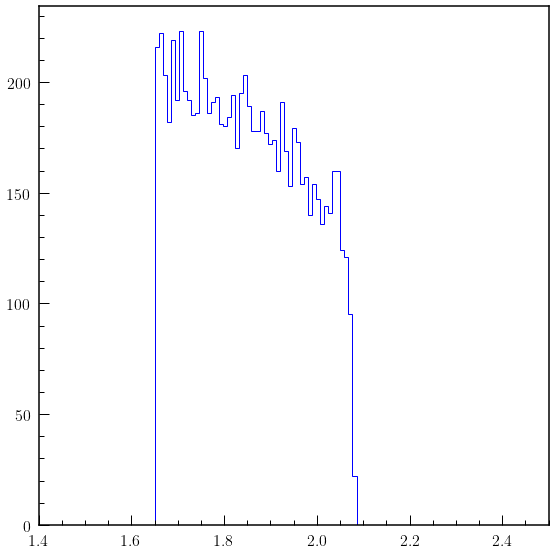

In [10]:
plt.figure(figsize=(8,8))
plt.hist(infoHewett['redshift'], color='b', bins=50, histtype='step')
plt.xlim(1.4,2.5)

In [11]:
#We are going to want to restrict the redshift range, do it like this.
zem = np.array(infoHewett['redshift'])

# Number with z<1.75
zmask = ((zem<=1.75))
print (len(infoHewett[zmask]), len(infoHewett))
print (len(X[zmask]))
print (zem)

2329 8653
2329
[1.779394 1.882529 1.668503 ... 1.717688 1.997207 1.65575 ]


Text(0, 0.5, 'W3')

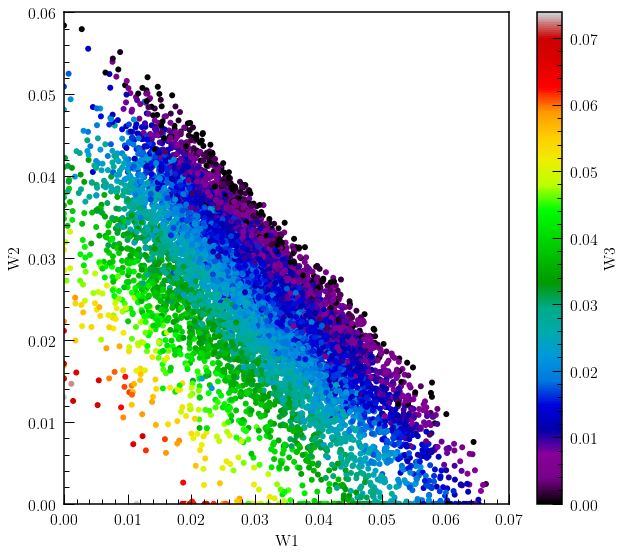

In [12]:
#Distribution of quasars in ICA weight space
plt.figure(figsize=(9,8))

plt.scatter(W1, W2, c=W3, cmap="nipy_spectral", edgecolor="None")
plt.xlabel('W1')
plt.ylabel('W2')
plt.xlim(0,0.07)
plt.ylim(0,0.06)
cbar = plt.colorbar()
cbar.ax.set_ylabel('W3')

In [13]:
#GTR: Did this a different way below.
#np.savetxt("grdr7.tSNE2.csv", projTSNE2, delimiter=",")

In [14]:
# t-SNE
from sklearn.manifold import TSNE
tsne2 = TSNE(n_components = 2)
projTSNE2 = tsne2.fit_transform(X[:,:6])

#dproj = tsne2.fit_transform(wt_dX)
#ndproj = tsne2.fit_transform(wt_ndX)

In [15]:
dproj = projTSNE2[wt_dMask==1] #organize coordinates to match d/nd in bokeh plot
ndproj = projTSNE2[wt_dMask==-1]
all_data_proj = projTSNE2[abs(wt_dMask)==1]

In [16]:
print(projTSNE2)

[[ -0.3210771 -20.867882 ]
 [-26.167881  -13.464881 ]
 [-34.638874  -61.688766 ]
 ...
 [-35.30297   -57.54211  ]
 [  2.3971863 -41.19725  ]
 [-61.788586   29.684326 ]]


In [17]:
#Output tSNE projections to file
#infile1 = 'grdr7.radec'
#infoCoords = pd.read_csv(infile1, sep = ' ', names=["name", "RA", "Dec"])

df = pd.DataFrame({'Name':infoCoords['name'],'RA':infoCoords['RA'],'Dec':infoCoords['Dec'], 'Proj1':projTSNE2[:,0], 'Proj2':-1.0*projTSNE2[:,1]})
df.to_csv('grdr7.radec.projTSNE.csv')


In [18]:
#Read in radio data
R = np.array(infoShen['R6CM2500A']).astype(float)
FIRST = np.array(infoShen['FINTREST6CM']).astype(float)

In [19]:
#Radio-loud mask
RLmask = (R>10)

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


In [20]:
projTSNE2rad = projTSNE2[RLmask]
print (len(projTSNE2), len(projTSNE2rad))

8653 519


In [21]:
#We are going to want to restrict the redshift range, do it like this.
zem = np.array(infoHewett['redshift'])

# Number with 1.55<z.1.75
#zmask = ((zem>1.65)&(zem<=1.658))
zmask = ((zem>1.645)&(zem<=1.6519))
print (len(infoHewett[zmask]), len(infoHewett))
print (len(X[zmask]))

#print (infoHewett[zmask])

50 8653
50


Two of these 50 are FIRST sources, 4 are BALs.

2353 and 1019

50


/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))
/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


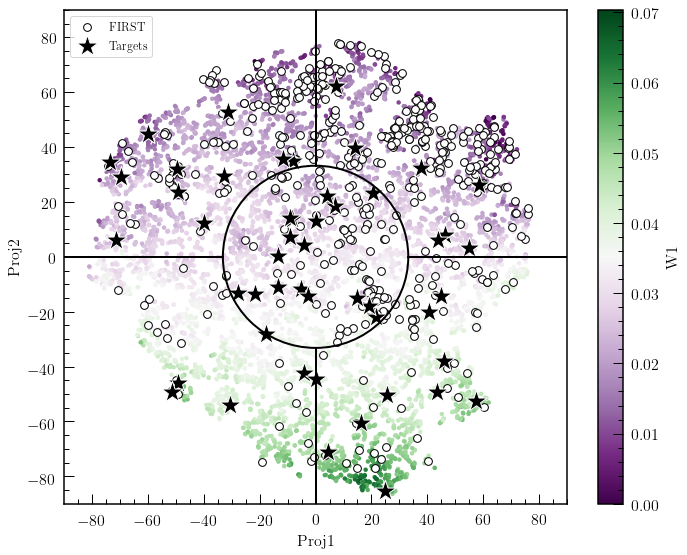

In [22]:
# Find radius of circle containing 20% of the sources and plot
x0 = 0 #take center of circle to be 0,0
y0 = 0
x  = projTSNE2[:,0]
y  = projTSNE2[:,1]
# Find radial coordinate of each point
r  = np.sqrt((x - x0)**2 + (y - y0)**2)
t  = 20 # percent
# Find radius that corresponds to t percentile
r0 = np.percentile(r, t)

plot = plt.figure(figsize=(10,8))

projTSNE2col = projTSNE2[cMask>0]
projTSNE2radcol = projTSNE2[(cMask>0)&(RLmask)]
projTSNE2colz = projTSNE2[(cMask>0)&(zmask)]
print (len(projTSNE2colz))

#Arbitrarily flip the signs of the y-axis projection so that the quadrants align with the CIV plot
#plt.scatter(projTSNE2col[:,0], -1.0*projTSNE2col[:,1], c=W1[cMask>0], cmap="nipy_spectral", edgecolor="None", s=20)
plt.scatter(projTSNE2col[:,0], -1.0*projTSNE2col[:,1], c=W1[cMask>0], cmap="PRGn", edgecolor="None", s=20)
#plt.scatter(projTSNE2col[:,0], -1.0*projTSNE2col[:,1], c=W1[cMask>0], cmap="RdYlBu", edgecolor="None", s=20)
plt.xlabel("Proj1")
plt.ylabel("Proj2")
cbar = plt.colorbar()
cbar.ax.set_ylabel('W1')
plt.scatter(projTSNE2radcol[:,0], -1.0*projTSNE2radcol[:,1], c='w', edgecolor='k', s=60, label="FIRST")
plt.scatter(projTSNE2colz[:,0], -1.0*projTSNE2colz[:,1], c='k', edgecolor='w', s=500, marker='*', label="Targets")
plt.xlabel("Proj1")
plt.xlim(-90,90)
plt.ylim(-90,90)
plt.legend(loc="upper left")

circle=plt.Circle((0, 0), r0, color='k', fill=False, linewidth=2)
fig = plt.gcf()
fig.gca().add_artist(circle)

plt.plot([0,0], [r0,100], c='k', linewidth=2)
plt.plot([0,0], [-r0,-100], c='k', linewidth=2)
plt.plot([r0,100], [0,0], c='k', linewidth=2)
plt.plot([-r0,-100], [0,0], c='k', linewidth=2)
plt.savefig('newPGtargets.pdf')

In [23]:
def make_sameName(i): #remove necessary characters to match image formatting (only to arcsec, remove SDSS) -- elim J as well : 8/23
    
    i = list(i)
    i.pop(0)
    i.pop(0)
    i.pop(0)
    i.pop(0)
    i.pop(0)
    i.pop(4)
    i.pop(4)
    i.pop(4)
    i.pop(4)
    i.pop(4)
    i.pop(9)
    i.pop(9)
    i.pop(9)
    i.pop(9)

    i = ''.join(i)

    return i


Create Interactive Bokeh Plot of Data Above:

J1019+4948 is labelled as a target in this but was not observed (not in OPT)

In [24]:
#Create infoTrevor -- this makes it easier to edit data and apply that to Bokeh plot properties

trevorsTargets = infoHewett[abs(wt_dMask)==1] #excludes 2 FIRST sources
#print(trevorsTargets)

thesenames=["name", "redshift", "W1", "W2", "W3", "W4", "W5", "W6", "detection", "peak_flux", "int_flux"]
trevor = pd.DataFrame(trevorsTargets, columns=thesenames)

#trevor.to_csv("Trevors_finalFigs.csv")

In [40]:
infoTrevor = pd.read_csv('Trevors_finalFigs.csv', skiprows=1, names=["index", "name", "redshift", "W1", "W2", "W3", "W4", "W5", "W6", "UNI_FLAG", "MIZ2", "detection", "UNI_DET", "peak_flux", "int_flux"])

dMask = np.array(infoTrevor["detection"])
uniMask = np.array(infoTrevor["UNI_FLAG"])

pfs = np.array(infoTrevor['peak_flux'])
d_pfs = pfs[dMask==1].astype(float) #the peak flux for each detection -- to be applied to size of data points
uniform_pfs = pfs[uniMask==1] #for highlight glyphs to match size of diamond markers

ifs = np.array(infoTrevor['int_flux'])
d_ifs = ifs[dMask==1] #same for int flux

nd_pfs = pfs[dMask==-1]

#print(np.array(infoTrevor[dMask==1]))
#print(infoTrevor)
#print(uniform_pfs)

In [26]:
import bokeh.palettes as pal
from bokeh.plotting import figure, ColumnDataSource, output_file, show, output_notebook
from bokeh.models import HoverTool

Create data sources and hover tools for d/nd

In [53]:
unisz = np.array([((8/150)*x+9) for x in pfs])

In [54]:
detection_data = np.array(infoTrevor[dMask==1])  #make array for all data of detections

detection_names = [] #make new list to iterate through all obs names
for i in detection_data:
    detection_names.append(i[1])
detection_same_names = [make_sameName(x) for x in detection_names] #create list with new names titled JXXXX+XXXX

detection_source = ColumnDataSource(data=dict(  #create source for detections
    
    x = dproj[:,0], 
    y = -1.0*dproj[:,1], #flip y-axis
    obs_detection = detection_same_names,
    imgs_4p5am_detection = [('bokeh_imgs/4p5am/Detections/' + name + '_4p5am.png') for name in detection_same_names], 
    imgs_90as_detection = [('bokeh_imgs/90as/Detections/' + name + '_90as.png') for name in detection_same_names],
    pf = d_pfs,
    intf = d_ifs,
    sz = [((8/150)*x+7) for x in d_pfs]
))


#Now make another source for the non-detections
nondetection_data = np.array(infoTrevor[dMask==-1])  

nondetection_names = [] #make new list to iterate through all obs names
for i in nondetection_data:
    nondetection_names.append(i[1])
nondetection_same_names = [make_sameName(x) for x in nondetection_names] #create list with new names titled JXXXX+XXXX

nondetection_source = ColumnDataSource(data=dict(  #create source for detections
    
    x = ndproj[:,0], 
    y = -1.0*ndproj[:,1], #flip y-axis
    obs_nondetection = nondetection_same_names,
    imgs_4p5am_nondetection = [('bokeh_imgs/4p5am/NonDetections/' + name + '_4p5am.png') for name in nondetection_same_names], 
    imgs_90as_nondetection = [('bokeh_imgs/90as/NonDetections/' + name + '_90as.png') for name in nondetection_same_names],
    pf = nd_pfs
    
))

UNI_source_det = ColumnDataSource(data=dict(
    
    x = dproj[:,0],
    y = -1.0*dproj[:,1],
    op = 0.5 * uniMask[dMask==1],
    sz = unisz[dMask==1]
    
))


UNI_source_nondet = ColumnDataSource(data=dict(
    
    x = ndproj[:,0],
    y = -1.0*ndproj[:,1],
    op = 0.5 * uniMask[dMask==-1]
    
))


In [55]:
dhover = HoverTool(names = ["Detections"], tooltips='''
    <div>
        <div>
            <img
                src="@imgs_4p5am_detection" height="250" alt="@imgs_4p5am_detection" width="250"
                style="float: left; margin: 0px 15px 15px 0px;"
                border="2"
            ></img>
            
            <img       
                src="@imgs_90as_detection" height="250" alt="@imgs_90as_detection" width="250"
                style="float: left; margin: 0px 15px 15px 0px;"
                border="2"
            ></img>
        </div> 
          
        <div>
            <span style="font-size: 17px; font-weight: bold;">@obs_detection</span>
            <span style="font-size: 15px; color: #966;">[$index]</span>
        </div>
        
        <div>
            <span style="font-size: 16px; font-weight: bold;">Peak Flux (uJy/beam) =</span>
            <span style="font-size: 13px; color: #966;">@pf</span>
        </div>
        
        <div>
            <span style="font-size: 16px; font-weight: bold;">Integrated Flux (uJy) =</span>
            <span style="font-size: 13px; color: #966;">@intf</span>
        </div>
        
        <div>
            <span style="font-size: 15px;">Location</span>
            <span style="font-size: 10px; color: #696;">($x, $y)</span>
        </div>
        
    </div>


                      ''')

ndhover = HoverTool(names = ["NonDetections"], tooltips='''
    <div>
        <div>
            <img
                src="@imgs_4p5am_nondetection" height="250" alt="@imgs_4p5am_nondetection" width="250"
                style="float: left; margin: 0px 15px 15px 0px;"
                border="2"
            ></img>
            
            <img       
                src="@imgs_90as_nondetection" height="250" alt="@imgs_90as_nondetection" width="250"
                style="float: left; margin: 0px 15px 15px 0px;"
                border="2"
            ></img>
        </div> 
          
        <div>
            <span style="font-size: 17px; font-weight: bold;">@obs_nondetection</span>
            <span style="font-size: 15px; color: #966;">[$index]</span>
        </div>
         <div>
            <span style="font-size: 16px; font-weight: bold;">Peak Flux (uJy/beam) <</span>
            <span style="font-size: 13px; color: #966;">@pf</span>
        </div>
        <div>
            <span style="font-size: 15px;">Location</span>
            <span style="font-size: 10px; color: #696;">($x, $y)</span>
        </div>
    </div>


                      ''')

Make bokeh plot

In [56]:
output_file('interactive_VLA2018b_size_and_uniform')
output_notebook()


cmap = pal.brewer['PRGn'][11] 
sf = 11/.075 #scale position in color map to fit an index

p = figure(plot_width=800, plot_height=800, title="",
           x_range=[-100, 100], y_range = [-100, 100], tools=[dhover, ndhover, 'pan,box_zoom,wheel_zoom,save,reset,help'])

p.legend.location = 'top_right'

W1_cMask = W1[cMask>0]
for i in range(len(W1_cMask)): #loop through each weight and determine color based on weight
    p.circle(projTSNE2col[i,0], -1.0*projTSNE2col[i,1], color=cmap[10-int(W1_cMask[i]*sf)], name = "Background") #plot background sources (cmap inverted to match original)

p.circle(projTSNE2radcol[:,0], -1.0*projTSNE2radcol[:,1], line_color = 'black', fill_color = 'white', 
         size = 10, legend = 'FIRST') #FIRST sources

#FIRST and background are OK -- fix projections for targets

p.diamond_cross(x='x', y='y', color = 'red', size = 'sz', 
                source=detection_source, name = "Detections", legend = 'Detections') #Detections

p.diamond_cross(x='x', y='y', color = 'black', size = 15, 
               source=nondetection_source, name = "NonDetections", legend = 'Non-Detections') #NonDetections


#add glyph for UNI_FLAG -- add opaque circles over sources with UNI_FLAG==1 and nothing over UNI_FLAG==0
p.circle(x='x', y='y', fill_color='yellow', line_width=0, size='sz', fill_alpha='op', source=UNI_source_det)
p.circle(x='x', y='y', fill_color='yellow', line_width=0, size=18, fill_alpha='op', source=UNI_source_nondet)



p.circle(x=0, y=0, fill_alpha=0, size=250, line_color='black')
p.line(x=[0,0], y=[r0,100], color='black', line_width=2)
p.line(x=[0,0], y=[-r0,-100], color='black', line_width=2)
p.line(x=[r0,100], y=[0,0], color='black', line_width=2)
p.line(x=[-r0,-100], y=[0,0], color='black', line_width=2)



show(p)

Loading BokehJS ...

Test for correlation with MIZ2

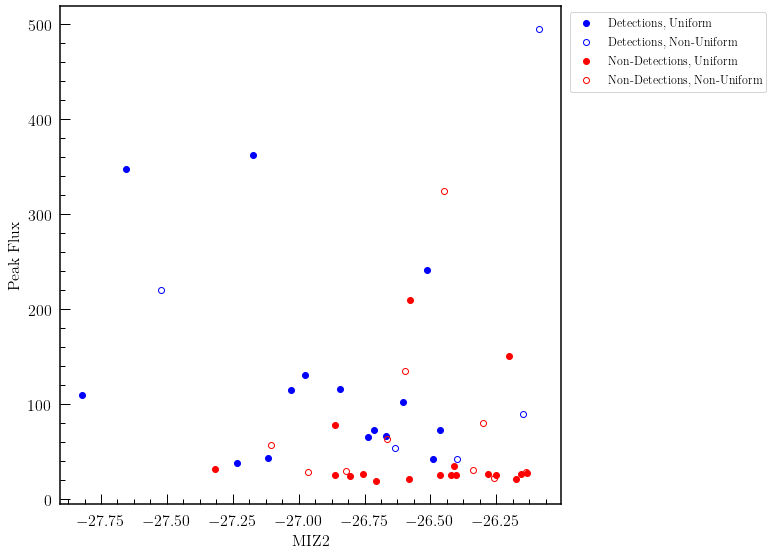

In [37]:
miz2 = np.array(infoTrevor["MIZ2"])
duniMask = np.array(infoTrevor["UNI_DET"])  #mask to sep det/nd from whether or not they are ALSO uniform

d_uni_MIZ2 = miz2[duniMask==2]
d_uni_pfs = pfs[duniMask==2]

d_nuni_MIZ2 = miz2[duniMask==1]
d_nuni_pfs = pfs[duniMask==1]

nd_uni_MIZ2 = miz2[duniMask==-1] 
nd_uni_pfs = pfs[duniMask==-1]

nd_nuni_MIZ2 = miz2[duniMask==-2]
nd_nuni_pfs = pfs[duniMask==-2]

plt.figure(figsize=(12,8))
plt.plot(d_uni_MIZ2, d_uni_pfs, 'bo', label='Detections, Uniform')
plt.plot(d_nuni_MIZ2, d_nuni_pfs, 'bo', markerfacecolor="None", label='Detections, Non-Uniform')
plt.plot(nd_uni_MIZ2, nd_uni_pfs, 'ro', label='Non-Detections, Uniform')
plt.plot(nd_nuni_MIZ2, nd_nuni_pfs, 'ro', markerfacecolor="None", label='Non-Detections, Non-Uniform') 
plt.legend(bbox_to_anchor=(1.42, 1))
plt.xlabel('MIZ2')
plt.ylabel('Peak Flux')
plt.show()

(-28, -26)

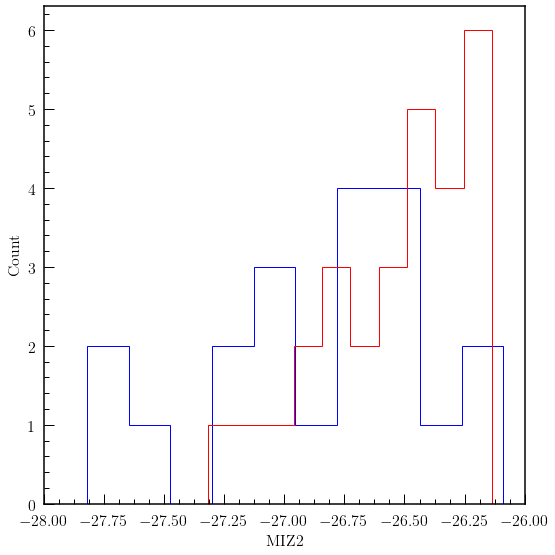

In [58]:
dMIZ2 = miz2[dMask==1]
ndMIZ2 = miz2[dMask==-1]

plt.figure(figsize=(8,8))
plt.hist(dMIZ2, color='b', bins=10, histtype='step', label='')
plt.hist(ndMIZ2, color='r', bins=10, histtype='step')
plt.xlabel('MIZ2')
plt.ylabel('Count')
plt.xlim(-28,-26)